# Move2Data Implementation

In [19]:
import pandas as pd
from pytorch_forecasting import TimeSeriesDataSet
from pytorch_forecasting.data.encoders import TorchNormalizer
from Move2Data import Missings, IntraInter, Viz,Standard

## 1. Load 3D Coordinates
In this case, the 3D coordinates were already calculated and gathered from the AIST++ Database. If you need to calculate them you can use a pretrained model such as Google BlazePose to do so.

In [2]:
df= pd.read_csv("./gBR_sBM_cAll_d04_mBR0_ch01.csv")
df.head()

,x_nose,x_left_eye,x_right_eye,x_left_ear,x_right_ear,x_left_shoulder,x_right_shoulder,x_left_elbow,x_right_elbow,x_left_wrist,...,z_right_elbow,z_left_wrist,z_right_wrist,z_left_hip,z_right_hip,z_left_knee,right_knee,z_left_ankle,z_right_ankle,File
0,2.811381,6.443991,-0.888119,8.287625,-7.393085,7.185017,-23.187701,25.944914,-47.825110,49.759202,...,7.591870,-26.939289,16.869176,3.844392,5.666800,22.902547,12.277411,27.812847,-14.928980,gBR_sBM_cAll_d04_mBR0_ch01
1,2.393488,6.054919,-0.865358,8.473190,-7.036685,7.067114,-23.577629,25.382908,-47.965093,49.786271,...,5.113028,-25.001745,15.287493,4.074815,5.606112,22.690483,12.011678,27.834188,-15.238521,gBR_sBM_cAll_d04_mBR0_ch01
2,2.059133,5.392073,-2.001808,8.285789,-7.292537,6.947721,-23.560164,25.218422,-48.498517,49.395674,...,4.319249,-23.809002,14.276912,4.107870,5.508918,22.474333,11.689471,27.528276,-15.153532,gBR_sBM_cAll_d04_mBR0_ch01
3,2.347636,5.999596,-1.573508,8.781095,-7.741398,7.338079,-23.213041,25.628188,-48.374616,49.852854,...,4.299508,-22.105832,13.372443,3.641365,5.249053,21.798189,11.179449,27.789719,-15.355020,gBR_sBM_cAll_d04_mBR0_ch01
4,1.520853,5.329645,-2.083216,8.631629,-7.759764,7.411428,-23.664452,26.184688,-48.765197,50.426448,...,3.681385,-19.868647,12.875892,3.337665,4.850878,21.293792,10.904578,27.533570,-15.337274,gBR_sBM_cAll_d04_mBR0_ch01


In [4]:
df.columns

Index(['x_nose', 'x_left_eye', 'x_right_eye', 'x_left_ear', 'x_right_ear',
       'x_left_shoulder', 'x_right_shoulder', 'x_left_elbow', 'x_right_elbow',
       'x_left_wrist', 'x_right_wrist', 'x_left_hip', 'x_right_hip',
       'x_left_knee', 'x_right_knee', 'x_left_ankle', 'x_right_ankle', 'Frame',
       'y_nose', 'y_left_eye', 'y_right_eye', 'y_left_ear', 'y_right_ear',
       'y_left_shoulder', 'y_right_shoulder', 'y_left_elbow', 'y_right_elbow',
       'y_left_wrist', 'y_right_wrist', 'y_left_hip', 'y_right_hip',
       'y_left_knee', 'y_right_knee', 'y_left_ankle', 'y_right_ankle',
       'z_nose', 'z_left_eye', 'z_right_eye', 'z_left_ear', 'z_right_ear',
       'z_left_shoulder', 'z_right_shoulder', 'z_left_elbow', 'z_right_elbow',
       'z_left_wrist', 'z_right_wrist', 'z_left_hip', 'z_right_hip',
       'z_left_knee', 'z_right_knee', 'z_left_ankle', 'z_right_ankle', 'File'],
      dtype='object')

## 2. Intra- and Inter- Movement Transformation

In [5]:
#list defining the keypoints we are working with, excluding the reference joint
keypoints= ['nose', 'left_eye', 'right_eye', 'left_ear', 'right_ear',
       'left_shoulder', 'right_shoulder', 'left_elbow', 'right_elbow',
       'left_wrist', 'right_wrist','right_hip',
       'left_knee', 'right_knee', 'left_ankle', 'right_ankle']

In [6]:
dfq= IntraInter.intra_inter_transform(keypoints,df, reference_joint="left_hip")
dfq.head()

,r_nose,sin_nose,cos_nose,z_nose,r_left_eye,sin_left_eye,cos_left_eye,z_left_eye,r_right_eye,sin_right_eye,...,sin_left_ankle,cos_left_ankle,z_left_ankle,r_right_ankle,sin_right_ankle,cos_right_ankle,z_right_ankle,x_left_hip,y_left_hip,z_left_hip
0,64.757170,-0.992944,-0.118585,12.914932,67.771462,-0.985972,-0.166912,11.204872,68.937902,-0.998332,...,0.967906,0.251312,27.812847,61.823114,0.987384,0.158346,-14.928980,-4.867862,137.691970,3.844392
1,64.535852,-0.992927,-0.118722,13.545546,67.497423,-0.985828,-0.167759,11.748622,68.620250,-0.997939,...,0.969429,0.245370,27.834188,61.926020,0.988571,0.150759,-15.238521,-5.268359,137.854221,4.074815
2,64.421911,-0.993004,-0.118084,13.809624,67.356267,-0.986721,-0.162422,12.609811,68.503351,-0.998659,...,0.969360,0.245645,27.528276,62.119168,0.988838,0.148993,-15.153532,-5.548090,137.958308,4.107870
3,64.168263,-0.991605,-0.129308,14.492700,67.284824,-0.984104,-0.177595,12.669815,68.464019,-0.997955,...,0.972155,0.234340,27.789719,62.694528,0.989969,0.141283,-15.355020,-5.949821,138.381483,3.641365
4,64.285322,-0.992716,-0.120475,15.116370,67.517657,-0.985250,-0.171120,12.993704,68.398855,-0.998166,...,0.973672,0.227952,27.533570,63.140052,0.989417,0.145097,-15.337274,-6.223953,138.614796,3.337665


In [7]:
dfq['File']=df.File
dfq.head()

,r_nose,sin_nose,cos_nose,z_nose,r_left_eye,sin_left_eye,cos_left_eye,z_left_eye,r_right_eye,sin_right_eye,...,cos_left_ankle,z_left_ankle,r_right_ankle,sin_right_ankle,cos_right_ankle,z_right_ankle,x_left_hip,y_left_hip,z_left_hip,File
0,64.757170,-0.992944,-0.118585,12.914932,67.771462,-0.985972,-0.166912,11.204872,68.937902,-0.998332,...,0.251312,27.812847,61.823114,0.987384,0.158346,-14.928980,-4.867862,137.691970,3.844392,gBR_sBM_cAll_d04_mBR0_ch01
1,64.535852,-0.992927,-0.118722,13.545546,67.497423,-0.985828,-0.167759,11.748622,68.620250,-0.997939,...,0.245370,27.834188,61.926020,0.988571,0.150759,-15.238521,-5.268359,137.854221,4.074815,gBR_sBM_cAll_d04_mBR0_ch01
2,64.421911,-0.993004,-0.118084,13.809624,67.356267,-0.986721,-0.162422,12.609811,68.503351,-0.998659,...,0.245645,27.528276,62.119168,0.988838,0.148993,-15.153532,-5.548090,137.958308,4.107870,gBR_sBM_cAll_d04_mBR0_ch01
3,64.168263,-0.991605,-0.129308,14.492700,67.284824,-0.984104,-0.177595,12.669815,68.464019,-0.997955,...,0.234340,27.789719,62.694528,0.989969,0.141283,-15.355020,-5.949821,138.381483,3.641365,gBR_sBM_cAll_d04_mBR0_ch01
4,64.285322,-0.992716,-0.120475,15.116370,67.517657,-0.985250,-0.171120,12.993704,68.398855,-0.998166,...,0.227952,27.533570,63.140052,0.989417,0.145097,-15.337274,-6.223953,138.614796,3.337665,gBR_sBM_cAll_d04_mBR0_ch01


## 3. Length Standardization
As mentioned in the paper, the smallest series we have is 426 frames long. Therefore, we will cut this into 426 long series.

In [8]:
len(dfq)

720

In [9]:
Standard.standard_len(dfq, file="File", length=426, path="./")

True

## 4. PyTorch TimeSeries Dataset
To use the PyTorch TimeSeries Dataset, I recommend you check their <a href="https://pytorch-forecasting.readthedocs.io/en/stable/api/pytorch_forecasting.data.timeseries.TimeSeriesDataSet.html">documentation</a>, so you can use the latest version and fully adapt it to your needs.

You can find the debugged MultiNormalizer in the Move2Data library, also on this github.

## 5. Model
Here you should define and train your model.
## 6. Backtransformation of predictions
As the modelling step is not part of the scope of this project, we will assume our transformed dataset is the predicted dataset and backtransform it.

In [11]:
#list defining the keypoints we are working with, excluding the reference joint
keypoints= ['nose', 'left_eye', 'right_eye', 'left_ear', 'right_ear',
       'left_shoulder', 'right_shoulder', 'left_elbow', 'right_elbow',
       'left_wrist', 'right_wrist','right_hip',
       'left_knee', 'right_knee', 'left_ankle', 'right_ankle']

In [12]:
bk= IntraInter.intra_backtransform(keypoints, dfq, reference_joint="left_hip")

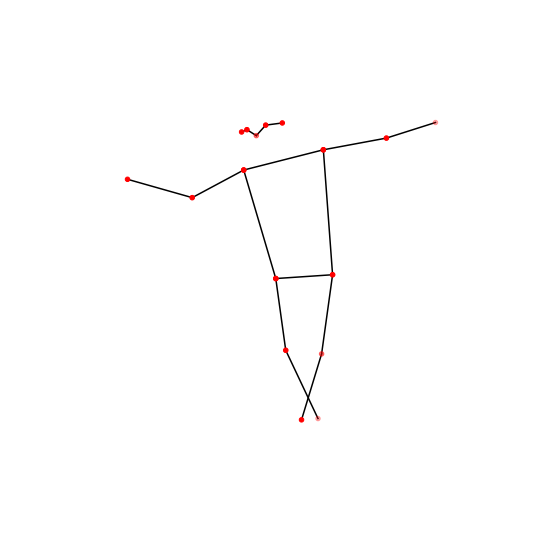

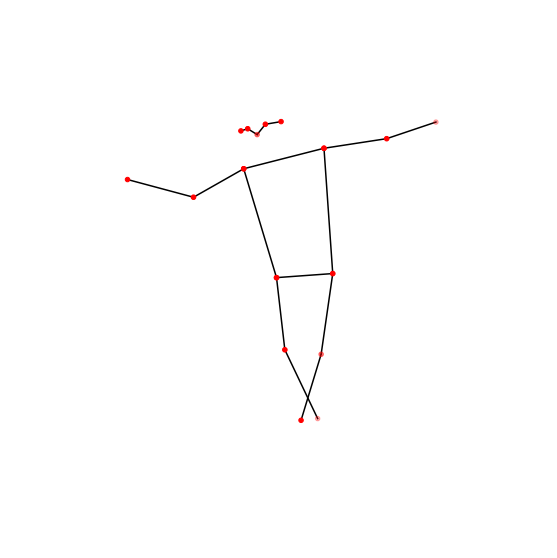

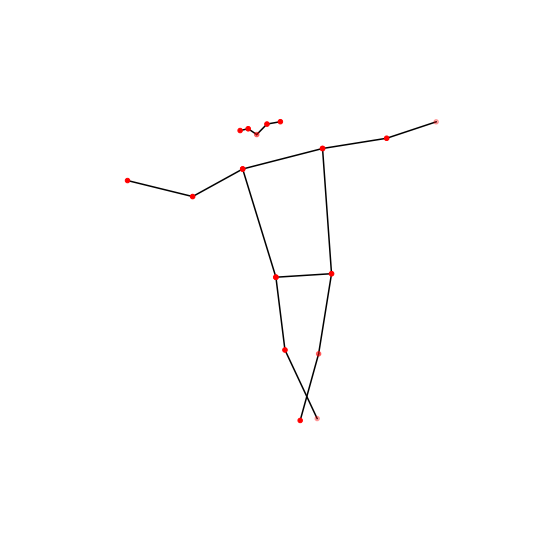

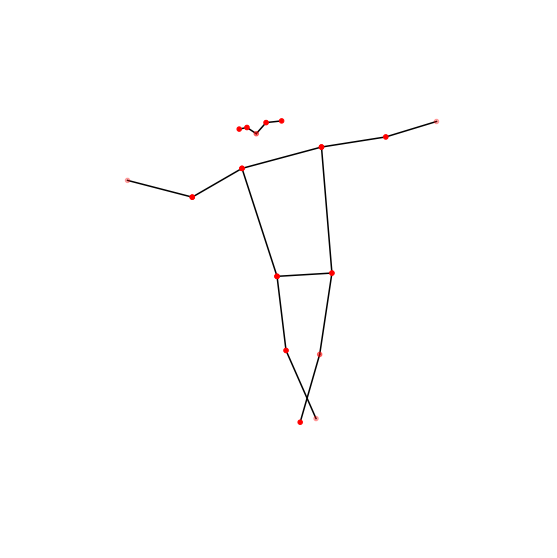

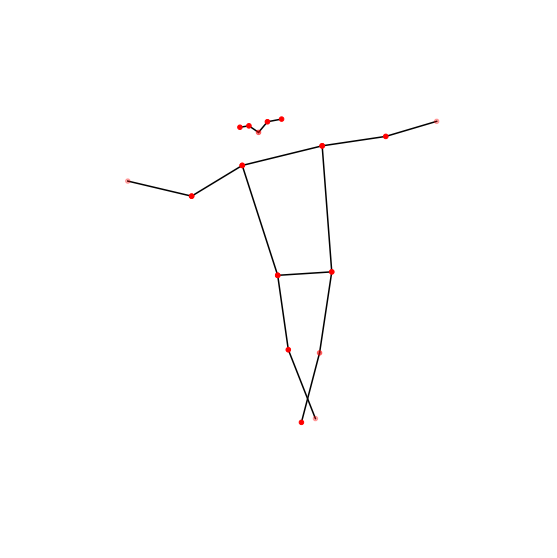

...

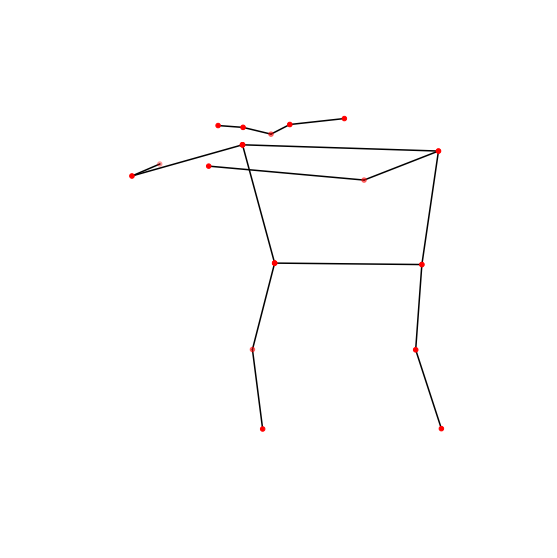

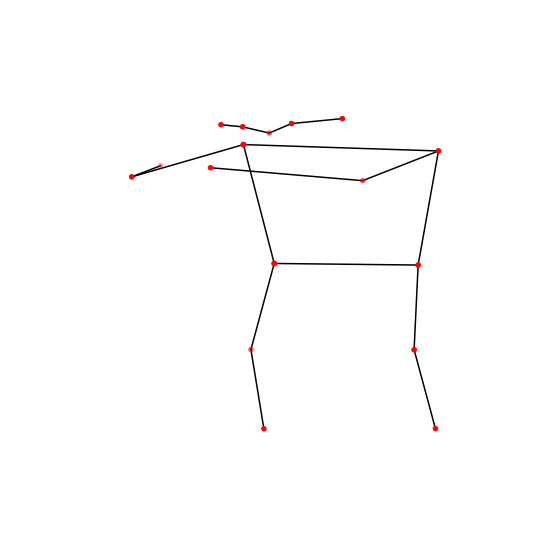

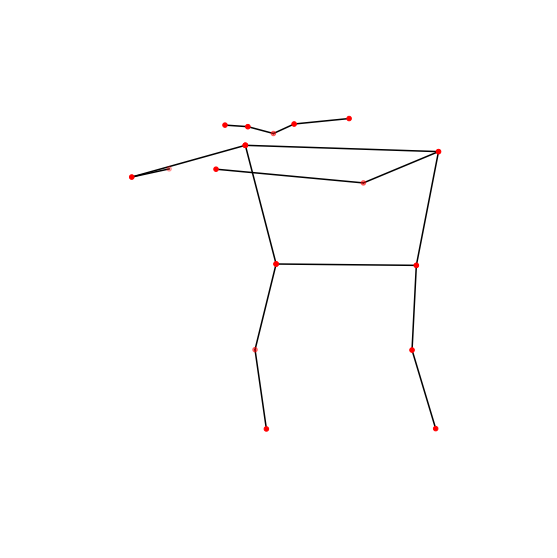

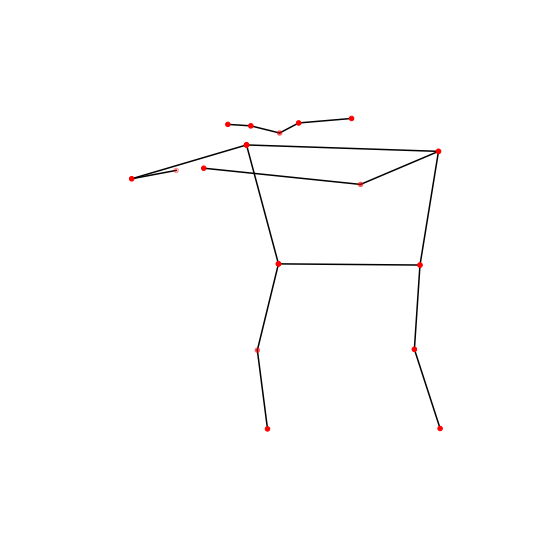

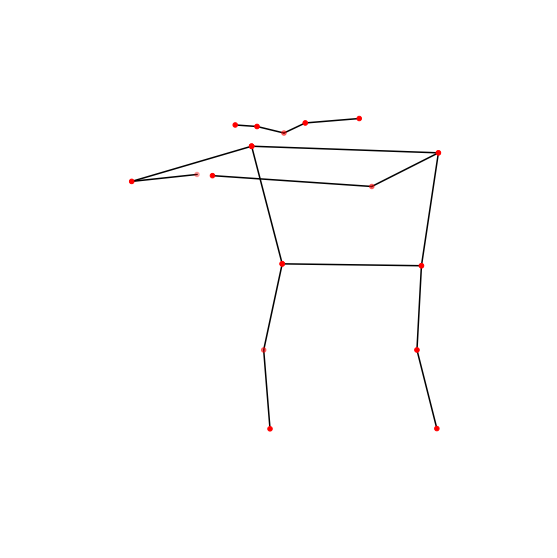

In [14]:
# visualize and save frames in folder
for frame in range(len(bk)):    
    ob=bk.iloc[frame]
    figure=Viz.get_plots(ob, elev=270, azim=270).get_figure()
    figure.savefig("./ExampleVid/Video_"+str(frame)+".png")

In [15]:
# create avi file
Viz.get_avi(426,"./ExampleVid/",
        "./ExampleVid/project.avi", 60)

True

In [20]:
#convert avi to mp4
Viz.get_mp4("./ExampleVid/project.avi",
        "./ExampleVid/project.mp4")

ffmpeg version 4.3.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with clang version 12.0.1
  configuration: --prefix=/Users/runner/miniforge3/conda-bld/ffmpeg_1645622006818/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_pl --cc=arm64-apple-darwin20.0.0-clang --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/Users/runner/miniforge3/conda-bld/ffmpeg_1645622006818/_build_env/bin/pkg-config --enable-cross-compile --arch=arm64 --target-os=darwin --cross-prefix=arm64-apple-darwin20.0.0- --host-cc=/Users/runner/miniforge3/conda-bld/ffmpeg_1645622006818/_build_env/bin/x86_64-apple-darwin13.4.0-cl

True